## Description and Goal

This is a Computer Vision project that aims to create a classification model for healthy plants and diseased plants. The dataset used is a dataset that is already available on [Kaggle](https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset). The dataset has 38 different classes and has been split into 80/20 portions for training and validation, and a testing directory has been prepared for model predictions. The method used in creating image classification models is Transfer Learning from the ResNet50 and EfficientNet V2 models ,Alexnet Model. Transfer Learning is the most effective and efficient method because many pre-trained models have been tested and can be used for other image classification tasks. Many papers suggest using the Transfer Learning method. The selected pre-trained model has good performance and the number of parameters is not too large so it does not burden the computing process. The performance of the pre-trained model can be seen in the [PyTorch documentation](https://pytorch.org/vision/stable/models.html). The main goal of this project is to conduct experiments and compare the pre-trained models and custom model to get the best classification model.

## **1. Getting Setup**

In [1]:
# import dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import time
import random

import torch
import torchvision

from torch import nn
from torch.utils.data import DataLoader
from torch.optim import Adam

from torchvision import transforms, datasets
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights

from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score
from timeit import default_timer as timer
from typing import Dict, List

In [5]:
%pip install -q torchinfo

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# try to get torch info, install it if it does not work
try:
    from torchinfo import summary
    print("[INFO] torchinfo imported successfully")
except:
    print("[INFO] Could not find torchinfo. Installing it.")

    from torchinfo import summary
    print("[INFO] torchinfo installed and imported successfully.")

[INFO] torchinfo imported successfully


In [3]:
# setting device
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("vipoooool/new-plant-diseases-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2


## **2. Get Data**

In [5]:
# access the dataset directory
dataset_dir = Path(r"C:/Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2")

print(dataset_dir)

C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2


In [6]:
# access train and validation directory
train_dir = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train"
val_dir = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid"
test_dir = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test"

print(f"Train Directory : {train_dir}")
print(f"Validation Directory : {val_dir}")
print(f"Test Directory : {test_dir}")

Train Directory : C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train
Validation Directory : C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid
Test Directory : C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test


## **3. Exploratory Data Analysis**

The general purpose of Exploratory Data Analysis (EDA) is to analyze data characteristics and find patterns, anomalies, and relationships between variables. In the EDA process, data cleaning is often carried out, such as handling missing values, removing duplicates, outliers, incorrect data, irrelevant data, imbalance data, and data transformation. This aims to obtain representative data so that the analysis results can provide useful insights for the business.

In Computer Vision tasks, EDA aims to ensure that the image dataset is truly clean, including in terms of data relevance, the annotations are complete, the format is the same, and the directory structure is appropriate so that the dataset is ready to be used for Machine Learning or Deep Learning modeling. Furthermore, EDA aims to find out the distribution of the dataset so that later it can be decided whether data augmentation is needed or not.

In this task, EDA is carried out to determine the dataset distribution, data format, and dataset samples. The dataset is considered clean because it has been prepared in a directory and is ready to be used for Computer Vision modeling.

In [7]:
total_class_train = len(os.listdir(train_dir))
total_class_val = len(os.listdir(val_dir))
total_test = len(os.listdir(test_dir))

print(f"Total of Train Data Classes: {total_class_train} classes")
print(f"Total of Validation Data Classes: {total_class_val} classes")
print(f"Total of Test Data: {total_test} images")

Total of Train Data Classes: 38 classes
Total of Validation Data Classes: 38 classes
Total of Test Data: 33 images


In [8]:
# display data distribution
def count_data_per_class(path):
    classes = sorted(os.listdir(path))
    class_counts = {}
    for cls in classes:
        class_path = os.path.join(path, cls)
        class_counts[cls] = len(os.listdir(class_path))
    return class_counts

# calculate total data of each class
train_class_counts = count_data_per_class(train_dir)
val_class_counts = count_data_per_class(val_dir)

# create dataframe class count
train_counts_df = pd.DataFrame.from_dict(train_class_counts, orient="index", columns=["Count"])
val_counts_df = pd.DataFrame.from_dict(val_class_counts, orient="index", columns=["Count"])

In [9]:
# total image for training and validation

print(f"Total Image for Training: {sum(train_class_counts.values())} images")
print(f"Total Image for Validation: {sum(val_class_counts.values())} images")

Total Image for Training: 70295 images
Total Image for Validation: 17572 images


In [10]:
train_counts_df

,Count
Apple___Apple_scab,2016
Apple___Black_rot,1987
Apple___Cedar_apple_rust,1760
Apple___healthy,2008
Blueberry___healthy,1816
Cherry_(including_sour)___Powdery_mildew,1683
Cherry_(including_sour)___healthy,1826
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,1642
Corn_(maize)___Common_rust_,1907
Corn_(maize)___Northern_Leaf_Blight,1908


In [11]:
val_counts_df

,Count
Apple___Apple_scab,504
Apple___Black_rot,497
Apple___Cedar_apple_rust,440
Apple___healthy,502
Blueberry___healthy,454
Cherry_(including_sour)___Powdery_mildew,421
Cherry_(including_sour)___healthy,456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,410
Corn_(maize)___Common_rust_,477
Corn_(maize)___Northern_Leaf_Blight,477


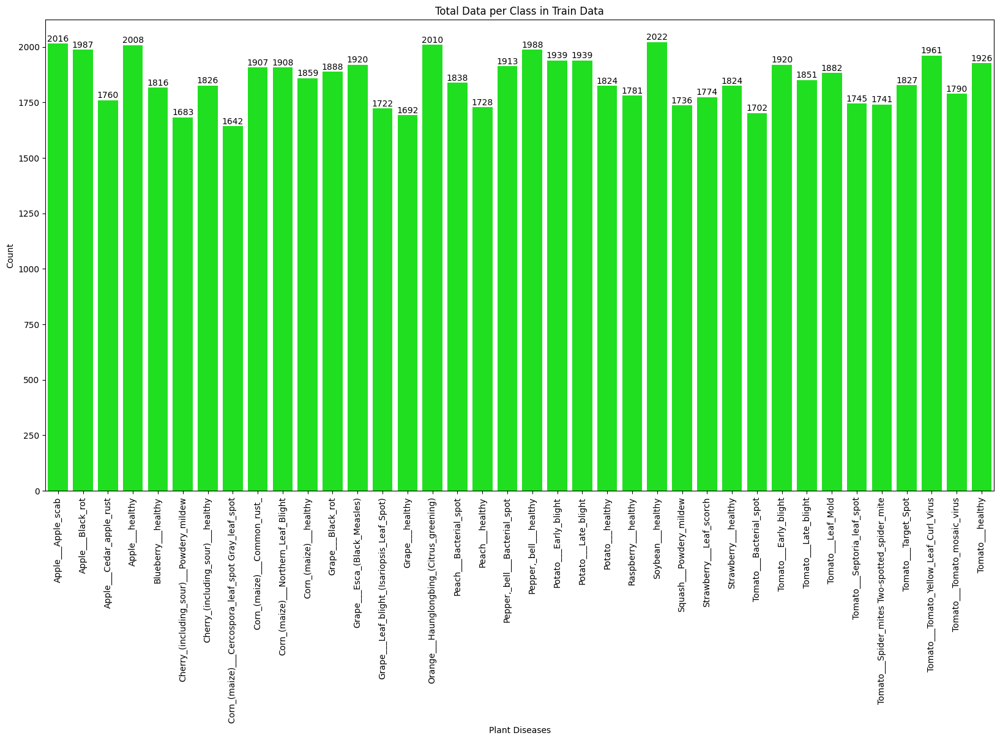

In [12]:
# display barplot for train data
plt.figure(figsize=(20, 10))
sns.barplot(data=train_counts_df, x=train_counts_df.index, y="Count", color="lime")
plt.title("Total Data per Class in Train Data")
plt.xlabel("Plant Diseases")
plt.ylabel("Count")
plt.xticks(rotation=90)

# get the current axes to make the number label on top each bar
ax = plt.gca()

# add count labels on top of each bar
for p in ax.patches:
    ax.text(p.get_x()+p.get_width()/2., # the count label position is center of each bar (x-coordinate)
            p.get_height()+10, # the count label offset of each bar (y-coordinate)
            '{:1.0f}'.format(p.get_height()), # get number of each bar height as count label
            ha="center") # the orientation of count label text is center horizontal

# saving plot
plt.savefig("Total Data per Class in Train Data.jpg")

# show the plot
plt.show()

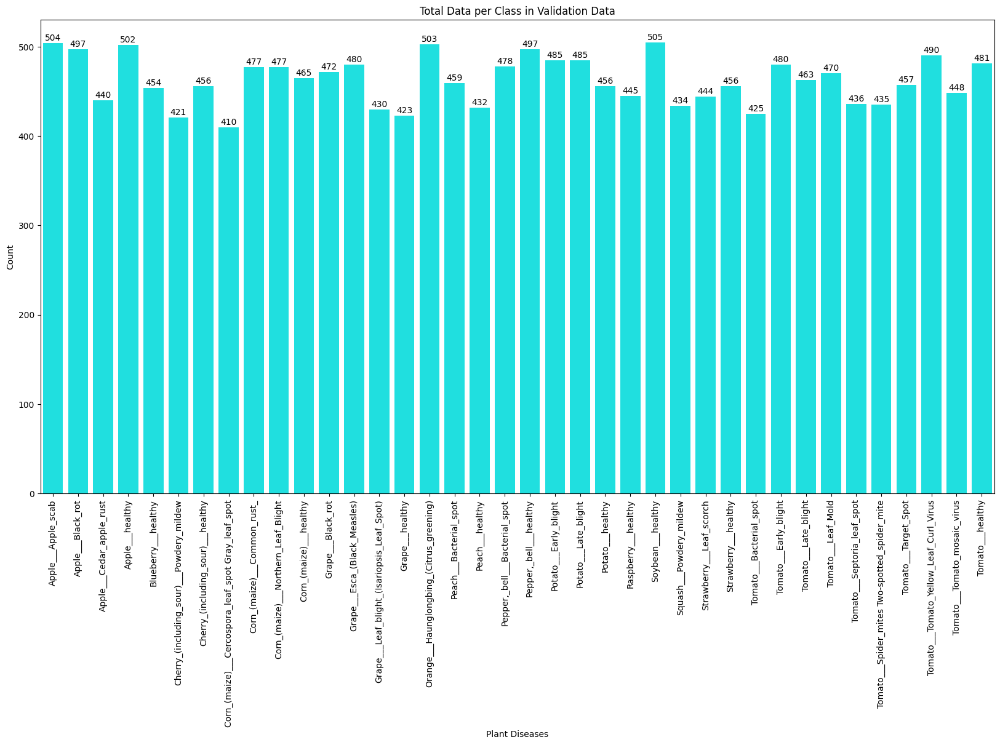

In [13]:
# display barplot for validation data
plt.figure(figsize=(20, 10))
sns.barplot(data=val_counts_df, x=val_counts_df.index, y="Count", color="cyan")
plt.title("Total Data per Class in Validation Data")
plt.xlabel("Plant Diseases")
plt.ylabel("Count")
plt.xticks(rotation=90)

# get the current axes to make the number label on top each bar
ax = plt.gca()

# add count labels on top of each bar
for p in ax.patches:
    ax.text(p.get_x()+p.get_width()/2., # the count label position is center of each bar (x-coordinate)
            p.get_height()+3, # the count label offset of each bar (y-coordinate)
            '{:1.0f}'.format(p.get_height()), # get number of each bar height as count label
            ha="center") # the orientation of count label text is center horizontal

# saving plot
plt.savefig("Total Data per Class in Validation Data.jpg")

# show the plot
plt.show()

In [14]:
# display plant types and diseases
all_diseases = sorted(os.listdir(train_dir))

plants = []
for cls in all_diseases:
    plant = cls.split("___")[0]
    if plant not in plants:
        plants.append(plant)

num_plants = len(plants)
print(f"Number of Plants: {num_plants} plants")
print("Kind of Plants: ")
for i, plant in enumerate(plants):
    print(f"{i+1}. {plant}")

diseases = []
for cls in all_diseases:
    disease = cls.split("___")[1]
    if disease not in diseases:
        if disease != "healthy":
            diseases.append(disease)
    
num_diseases = len(diseases)
print(f"\nNumber of Diseases: {num_diseases} diseases")
print("Kind of Diseases: ")
for i, disease in enumerate(diseases):
    print(f"{i+1}. {disease}")

Number of Plants: 14 plants
Kind of Plants: 
1. Apple
2. Blueberry
3. Cherry_(including_sour)
4. Corn_(maize)
5. Grape
6. Orange
7. Peach
8. Pepper,_bell
9. Potato
10. Raspberry
11. Soybean
12. Squash
13. Strawberry
14. Tomato

Number of Diseases: 20 diseases
Kind of Diseases: 
1. Apple_scab
2. Black_rot
3. Cedar_apple_rust
4. Powdery_mildew
5. Cercospora_leaf_spot Gray_leaf_spot
6. Common_rust_
7. Northern_Leaf_Blight
8. Esca_(Black_Measles)
9. Leaf_blight_(Isariopsis_Leaf_Spot)
10. Haunglongbing_(Citrus_greening)
11. Bacterial_spot
12. Early_blight
13. Late_blight
14. Leaf_scorch
15. Leaf_Mold
16. Septoria_leaf_spot
17. Spider_mites Two-spotted_spider_mite
18. Target_Spot
19. Tomato_Yellow_Leaf_Curl_Virus
20. Tomato_mosaic_virus


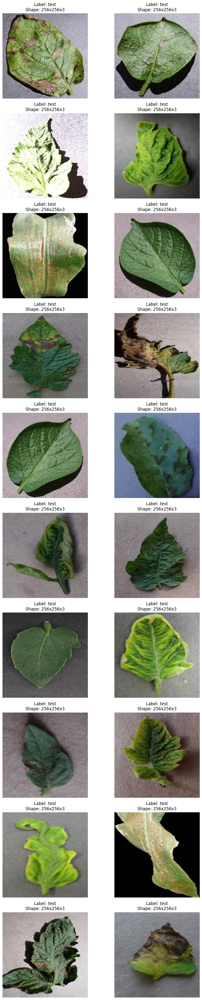

In [15]:
# display some images
random.seed(33)

# get all of the image paths
image_path_list = list(dataset_dir.glob("*/*/*.jpg"))

# choose 20 images paths randomly
random_image_paths = random.sample(image_path_list, 20)

# define the subplot
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 40))

# display 20 images randomly
for i, ax in enumerate(axes.flat):
    random_image_path = random_image_paths[i] # get image path
    image_class = random_image_path.parent.stem # get image class from path name as label
    image = Image.open(random_image_path) # open image
    ax.imshow(image) # display image on subplot
    
    # add label and shape of image
    ax.set_title(f"Label: {image_class}\nShape: {image.height}x{image.width}x{3 if image.mode == 'RGB' else 1}")
    ax.axis("off")

plt.tight_layout()
plt.show()

The EDA that has been carried out can be summarized in several points as follows:

1. The dataset has 38 classes.
2. The total training data is 70295 images and the total validation data is 17572 images.
3. Visually, the classes in the dataset are considered quite balanced because the differences are not too significant.
4. There are 14 types of plants and 20 types of diseases.
5. All images have the same shape, it is 256 x 256 x 3 (height x width x color channel).

From this information, the dataset is considered clean and ready to be used for modeling image classification tasks later. The transformation and data augmentation stages will still be carried out to improve model performance.

## **4. Dataset Preparation and Preprocessing**

This stage consists of:

1. Data Preprocessing (Transformation and Augmentation)
2. Loading Dataset

Starting from this stage to the modeling stage using PyTorch. Data transformation is carried out by the requirements of each pre-trained model that will be used.

### 4.1. Data Preprocessing

In [16]:
# create data transformation based on ResNet50 model (ResNet50_Weights.IMAGENET1K_V2)
train_transform_rn50 = transforms.Compose([
    transforms.Resize(size=232, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(size=224),
    transforms.RandomRotation(45), # augmentation: random rotation 45 degree
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform_rn50 = transforms.Compose([
    transforms.Resize(size=232, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(size=224),
    # do not augment in validation data
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [17]:
# create data transformation based on EfficientNet V2 model (EfficientNet_V2_S_Weights.IMAGENET1K_V1)
train_transform_ev2 = transforms.Compose([
    transforms.Resize(size=384, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(size=384),
    transforms.RandomRotation(45), # augmentation: random rotation 45 degree
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform_ev2 = transforms.Compose([
    transforms.Resize(size=384, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(size=384),
    # do not augment in validation data
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [19]:
# Create data transformations based on MobileNet preprocessing
train_transform_mobilenet = transforms.Compose([
    transforms.Resize(size=224, interpolation=transforms.InterpolationMode.BILINEAR),  # Resize to 224x224
    transforms.RandomRotation(45),  # Augmentation: random rotation 45 degrees
    transforms.CenterCrop(size=224),  # Crop to 224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalization values for ImageNet
                         std=[0.229, 0.224, 0.225])
])

val_transform_mobilenet = transforms.Compose([
    transforms.Resize(size=224, interpolation=transforms.InterpolationMode.BILINEAR),  # Resize to 224x224
    transforms.CenterCrop(size=224),  # Crop to 224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalization values for ImageNet
                         std=[0.229, 0.224, 0.225])
])


### 4.2. Loading Dataset

In [ ]:
# create ImageFolder for prepare dataset
# this method is easier than custom dataset, because dataset has already split by folder train and validation

# ImageFolder for ResNet50 model
train_dataset_rn50 = datasets.ImageFolder(root=train_dir, transform=train_transform_rn50)
val_dataset_rn50 = datasets.ImageFolder(root=val_dir, transform=val_transform_rn50)

# ImageFolder for EfficientNet V2 model
train_dataset_ev2 = datasets.ImageFolder(root=train_dir, transform=train_transform_ev2)
val_dataset_ev2 = datasets.ImageFolder(root=val_dir, transform=val_transform_ev2)

# ImageFolder for MobileNet Model
train_dataset_mob = datasets.ImageFolder(root=train_dir, transform=train_transform_mobilenet)
val_dataset_mob = datasets.ImageFolder(root=val_dir, transform=val_transform_mobilenet)

# display classes of ImageFolder dataset
print(f"Dataset Classes: {len(train_dataset_ev2.classes)}\n")
train_dataset_ev2.classes

Dataset Classes: 38



['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [21]:
# create DataLoader for ResNet50 model
train_dataloader_rn50 = DataLoader(train_dataset_rn50,
                                   batch_size=32,
                                   num_workers=2,
                                   shuffle=True)

val_dataloader_rn50 = DataLoader(val_dataset_rn50,
                                 batch_size=32,
                                 num_workers=2,
                                 shuffle=False) # do not shuffle on validation data

# create DataLoader for EfficientNet V2 model
train_dataloader_ev2 = DataLoader(train_dataset_ev2,
                                  batch_size=32,
                                  num_workers=2,
                                  shuffle=True)

val_dataloader_ev2 = DataLoader(val_dataset_ev2,
                                batch_size=32,
                                num_workers=2,
                                shuffle=False) # do not shuffle on validation data

# create DataLoader for Mobilenet
train_dataloader_mob = DataLoader(train_dataset_mob,
                                  batch_size=32,
                                  num_workers=2,
                                  shuffle=True)

val_dataloader_mob = DataLoader(val_dataset_mob ,
                                batch_size=32,
                                num_workers=2,
                                shuffle=False) # do not shuffle on validation data


print(f"Number of Train Dataloader: {len(train_dataloader_ev2)} batches")
print(f"Number of Validation Dataloader: {len(val_dataloader_ev2)} batches")

Number of Train Dataloader: 2197 batches
Number of Validation Dataloader: 550 batches


In [22]:
# looking information inside dataloader has made: ResNet50

# get the batch sample in the dataloader
# dataloader contains input and output (feature and label)
images, labels = next(iter(train_dataloader_rn50))

# get the number of batches in the dataloader
num_batches = len(train_dataloader_rn50)

# print out the summary
print("[DATALOADER FOR RESNET50 MODEL]\n")
print(f"Train Dataloader = {train_dataloader_rn50}\n")
print(f"Batch Sample:\nImage Shape = {images.shape}\nLabel Shape = {labels.shape}\nLabels = {labels.tolist()}")
print(f"Number of Batches = {num_batches} batches")
print(f"Number of All Data = {32*num_batches} images")

[DATALOADER FOR RESNET50 MODEL]

Train Dataloader = <torch.utils.data.dataloader.DataLoader object at 0x000002ACD0886300>

Batch Sample:
Image Shape = torch.Size([32, 3, 224, 224])
Label Shape = torch.Size([32])
Labels = [26, 9, 30, 24, 35, 24, 35, 18, 32, 6, 24, 37, 29, 3, 14, 26, 22, 4, 28, 24, 1, 10, 0, 28, 15, 5, 18, 21, 27, 13, 8, 20]
Number of Batches = 2197 batches
Number of All Data = 70304 images


In [23]:
# looking information inside dataloader has made: EfficientNet V2

# get the batch sample in the dataloader
# dataloader contains input and output (feature and label)
images, labels = next(iter(train_dataloader_ev2))

# get the number of batches in the dataloader
num_batches = len(train_dataloader_ev2)

# print out the summary
print("[DATALOADER FOR EFFICIENTNET V2 MODEL]\n")
print(f"Train Dataloader = {train_dataloader_ev2}\n")
print(f"Batch Sample:\nImage Shape = {images.shape}\nLabel Shape = {labels.shape}\nLabels = {labels.tolist()}")
print(f"Number of Batches = {num_batches} batches")
print(f"Number of All Data = {32*num_batches} images")

[DATALOADER FOR EFFICIENTNET V2 MODEL]

Train Dataloader = <torch.utils.data.dataloader.DataLoader object at 0x000002ACD0484BC0>

Batch Sample:
Image Shape = torch.Size([32, 3, 384, 384])
Label Shape = torch.Size([32])
Labels = [11, 35, 36, 22, 17, 25, 9, 31, 4, 35, 31, 37, 8, 9, 0, 10, 36, 24, 15, 37, 7, 1, 24, 19, 0, 28, 5, 0, 11, 4, 1, 28]
Number of Batches = 2197 batches
Number of All Data = 70304 images


In [25]:
# looking information inside dataloader has made: MobileNet

# get the batch sample in the dataloader
# dataloader contains input and output (feature and label)
images, labels = next(iter(train_dataloader_mob))

# get the number of batches in the dataloader
num_batches = len(train_dataloader_mob)

# print out the summary
print("[DATALOADER FOR MOBILENET MODEL ]\n")
print(f"Train Dataloader = {train_dataloader_mob}\n")
print(f"Batch Sample:\nImage Shape = {images.shape}\nLabel Shape = {labels.shape}\nLabels = {labels.tolist()}")
print(f"Number of Batches = {num_batches} batches")
print(f"Number of All Data = {32*num_batches} images")

[DATALOADER FOR MOBILENET MODEL ]

Train Dataloader = <torch.utils.data.dataloader.DataLoader object at 0x000002ACCE1F54C0>

Batch Sample:
Image Shape = torch.Size([32, 3, 224, 224])
Label Shape = torch.Size([32])
Labels = [7, 10, 9, 18, 9, 31, 29, 21, 11, 0, 3, 15, 20, 31, 24, 37, 34, 36, 3, 4, 36, 3, 30, 29, 12, 25, 0, 30, 15, 19, 23, 8]
Number of Batches = 2197 batches
Number of All Data = 70304 images


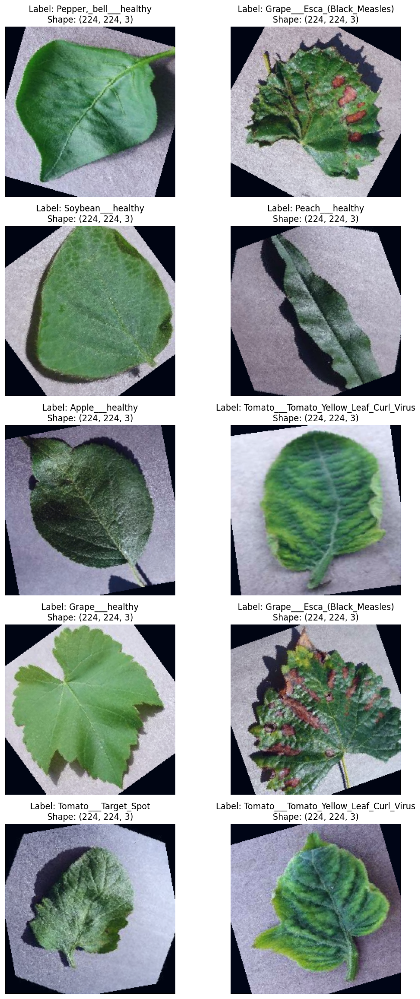

In [26]:
# visualize dataloader: ResNet50
torch.manual_seed(33)

# visualize the sample of train dataloader
batch_images, batch_labels = next(iter(train_dataloader_rn50))

# function for displaying 10 images randomly from dataloader
def display_images(images, labels, class_names, nrows=5, ncols=2):
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 20))
    for i, ax in enumerate(axes.flat):
        img = images[i].permute(1, 2, 0).numpy()
        img = (img - np.min(img)) / (np.max(img) - np.min(img)) # normalization display to 0 - 1
        ax.imshow(img)
        # get class name from label
        label_idx = labels[i].item()
        class_name = class_names[label_idx]
        # display class name
        ax.set_title(f"Label: {class_name}\nShape: {img.shape}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# display images
display_images(batch_images, batch_labels, train_dataset_rn50.classes)

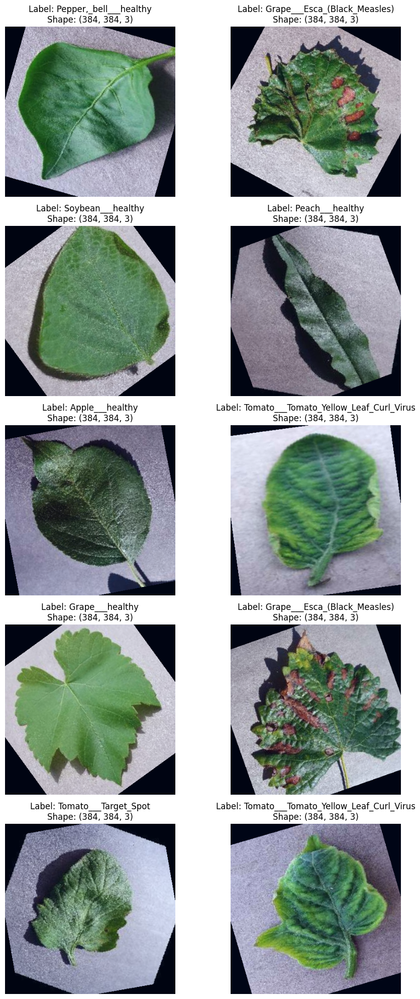

In [27]:
# visualize dataloader: EfficientNet V2
torch.manual_seed(33)

# visualize the sample of train dataloader
batch_images, batch_labels = next(iter(train_dataloader_ev2))

# function for displaying 10 images randomly from dataloader
def display_images(images, labels, class_names, nrows=5, ncols=2):
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 20))
    for i, ax in enumerate(axes.flat):
        img = images[i].permute(1, 2, 0).numpy()
        img = (img - np.min(img)) / (np.max(img) - np.min(img)) # normalization display to 0 - 1
        ax.imshow(img)
        # get class name from label
        label_idx = labels[i].item()
        class_name = class_names[label_idx]
        # display class name
        ax.set_title(f"Label: {class_name}\nShape: {img.shape}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# display images
display_images(batch_images, batch_labels, train_dataset_ev2.classes)

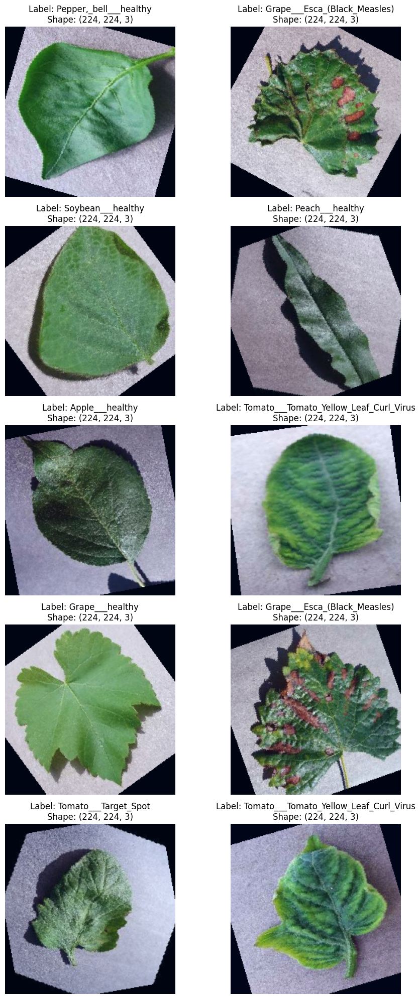

In [29]:
# visualize dataloader: MobileNet
torch.manual_seed(33)

# visualize the sample of train dataloader
batch_images, batch_labels = next(iter(train_dataloader_mob))

# function for displaying 10 images randomly from dataloader
def display_images(images, labels, class_names, nrows=5, ncols=2):
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 20))
    for i, ax in enumerate(axes.flat):
        img = images[i].permute(1, 2, 0).numpy()
        img = (img - np.min(img)) / (np.max(img) - np.min(img)) # normalization display to 0 - 1
        ax.imshow(img)
        # get class name from label
        label_idx = labels[i].item()
        class_name = class_names[label_idx]
        # display class name
        ax.set_title(f"Label: {class_name}\nShape: {img.shape}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# display images
display_images(batch_images, batch_labels, train_dataset_mob.classes)

## **5. Build Model**

This stage consists of:

1. Use of pre-trained model, [ResNet50](https://pytorch.org/vision/stable/models/generated/torchvision.models.resnet50.html#torchvision.models.ResNet50_Weights) and [EfficientNet V2](https://pytorch.org/vision/stable/models/generated/torchvision.models.efficientnet_v2_s.html#torchvision.models.EfficientNet_V2_S_Weights). The only parameters trained are the fully connected layer parameters.
2. Setting the loss function and optimizer. The loss function used is CrossEntropyLoss() because for multi-class classification and the optimizer used is Adam.
3. Creating a training function. The training function is used to run the training process. This function displays the loss and accuracy values for each epoch.

### 5.1. ResNet50 Model

In [30]:
# load pre-trained ResNet50 model: ResNet50_Weights.IMAGENET1K_V2
rn50_model = resnet50(weights=ResNet50_Weights.DEFAULT)

# modify fully connected layer
rn50_model.fc = nn.Sequential(nn.Linear(in_features=rn50_model.fc.in_features, out_features=38))

# freeze pre-trained layers
for param in rn50_model.parameters():
    param.requires_grad = False

# unfreeze fully connected layers
for param in rn50_model.fc.parameters():
    param.requires_grad = True

# put model into device
rn50_model = rn50_model.to(device)

In [31]:
# display ResNet50 model summary
summary(model=rn50_model,
        input_size=(32, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 38]             --                   Partial
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   (9,408)              False
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   (128)                False
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     (4,096)              False
│    │    

### 5.2. EfficientNet V2 Model

In [32]:
# load pre-trained EfficientNet V2 model: EfficientNet_V2_S_Weights.IMAGENET1K_V1
ev2_model = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.DEFAULT)

# modify fully connected layer
ev2_model.classifier = nn.Sequential(nn.Linear(in_features=1280, out_features=38))

# freeze pre-trained layers
for param in ev2_model.parameters():
    param.requires_grad = False

# unfreeze fully connected layers
for param in ev2_model.classifier.parameters():
    param.requires_grad = True

# put model into device
ev2_model = ev2_model.to(device)

In [33]:
# display EfficientNet V2 model summary
summary(model=ev2_model,
        input_size=(32, 3, 384, 384),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 384, 384]    [32, 38]             --                   Partial
├─Sequential (features)                                      [32, 3, 384, 384]    [32, 1280, 12, 12]   --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 384, 384]    [32, 24, 192, 192]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 384, 384]    [32, 24, 192, 192]   (648)                False
│    │    └─BatchNorm2d (1)                                  [32, 24, 192, 192]   [32, 24, 192, 192]   (48)                 False
│    │    └─SiLU (2)                                         [32, 24, 192, 192]   [32, 24, 192, 192]   --                   --
│    └─Sequential (1)                                        [32, 24, 192, 192]   [32, 

### 5.3 MobileNetV2 Model

In [36]:
# Load pre-trained MobileNetV2 model

mobilenet_model = mobilenet_v2(weights=MobileNet_V2_Weights.IMAGENET1K_V1)

# Modify the classifier layer for 38 output classes
mobilenet_model.classifier[1] = nn.Linear(in_features=mobilenet_model.classifier[1].in_features, out_features=38)

# Freeze pre-trained layers
for param in mobilenet_model.features.parameters():
    param.requires_grad = False

# Unfreeze the classifier layers
for param in mobilenet_model.classifier.parameters():
    param.requires_grad = True

# Put model into device
mobilenet_model = mobilenet_model.to(device)


In [37]:
# display Mobilenet model summary
summary(model=mobilenet_model,
        input_size=(32, 3, 384, 384),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
MobileNetV2 (MobileNetV2)                     [32, 3, 384, 384]    [32, 38]             --                   Partial
├─Sequential (features)                       [32, 3, 384, 384]    [32, 1280, 12, 12]   --                   False
│    └─Conv2dNormActivation (0)               [32, 3, 384, 384]    [32, 32, 192, 192]   --                   False
│    │    └─Conv2d (0)                        [32, 3, 384, 384]    [32, 32, 192, 192]   (864)                False
│    │    └─BatchNorm2d (1)                   [32, 32, 192, 192]   [32, 32, 192, 192]   (64)                 False
│    │    └─ReLU6 (2)                         [32, 32, 192, 192]   [32, 32, 192, 192]   --                   --
│    └─InvertedResidual (1)                   [32, 32, 192, 192]   [32, 16, 192, 192]   --                   False
│    │    └─Sequential (conv)                 [32, 32, 192, 192]   [32, 16, 1

### 5.4. Setting Loss Function

In [38]:
# use CrossEntropyLoss() for multiclass classification task
loss_fn = nn.CrossEntropyLoss()

### 5.5. Setting Optimizer

In [39]:
# Adam optimizer
optim_rn50 = Adam(params=rn50_model.parameters(), lr=0.001)
optim_ev2 = Adam(params=ev2_model.parameters(), lr=0.001)
optim_mobnet = Adam(params= mobilenet_model.parameters(), lr=0.001)

### 5.6. Create Training Function

In [40]:

# train loop function
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer):
    # put model in train mode
    model.train()

    # setup train loss, train accuracy, precision, recall, and f1-score
    train_loss, train_acc = 0, 0
    all_preds, all_labels = [], []

    # loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # send data to target device
        X, y = X.to(device), y.to(device)

        # 1. forward pass
        y_pred = model(X)

        # 2. calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. optimizer zero grad
        optimizer.zero_grad()

        # 4. loss backward
        loss.backward()

        # 5. optimizer step
        optimizer.step()

        # 6. calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item() / len(y_pred)

        # Store predictions and labels for precision, recall, and F1-score
        all_preds.extend(y_pred_class.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

    # adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)

    # Calculate precision, recall, and F1-score
    train_precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    train_recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    train_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return train_loss, train_acc, train_precision, train_recall, train_f1


In [41]:

# validation loop function
def val_step(model: torch.nn.Module,
             dataloader: torch.utils.data.DataLoader,
             loss_fn: torch.nn.Module):
    # put model in eval mode
    model.eval()

    # setup validation loss, accuracy, precision, recall, and f1-score
    val_loss, val_acc = 0, 0
    all_preds, all_labels = [], []

    # turn on inference context manager
    with torch.inference_mode():
        # loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # send data to target device
            X, y = X.to(device), y.to(device)

            # 1. forward pass
            val_pred_logits = model(X)

            # 2. calculate and accumulate loss
            loss = loss_fn(val_pred_logits, y)
            val_loss += loss.item()

            # 3. calculate and accumulate accuracy
            val_pred_labels = val_pred_logits.argmax(dim=1)
            val_acc += (val_pred_labels == y).sum().item() / len(val_pred_labels)

            # Store predictions and labels for precision, recall, and F1-score
            all_preds.extend(val_pred_labels.cpu().numpy())
            all_labels.extend(y.cpu().numpy())

    # adjust metrics to get average loss and accuracy per batch
    val_loss = val_loss / len(dataloader)
    val_acc = val_acc / len(dataloader)

    # Calculate precision, recall, and F1-score
    val_precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    val_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return val_loss, val_acc, val_precision, val_recall, val_f1


In [42]:
from tqdm import tqdm

# train process
def train_process(model: torch.nn.Module,
                  train_dataloader: torch.utils.data.DataLoader,
                  val_dataloader: torch.utils.data.DataLoader,
                  optimizer: torch.optim.Optimizer,
                  loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
                  epochs: int = 5):

    # create empty results dictionary
    results = {
        "train_loss": [],
        "train_acc": [],
        "train_precision": [],
        "train_recall": [],
        "train_f1": [],
        "val_loss": [],
        "val_acc": [],
        "val_precision": [],
        "val_recall": [],
        "val_f1": []
    }

    # loop through training and validation steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc, train_precision, train_recall, train_f1 = train_step(
            model=model,
            dataloader=train_dataloader,
            loss_fn=loss_fn,
            optimizer=optimizer
        )

        val_loss, val_acc, val_precision, val_recall, val_f1 = val_step(
            model=model,
            dataloader=val_dataloader,
            loss_fn=loss_fn
        )

        # print out training progress
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | "
            f"train_precision: {train_precision:.4f} | train_recall: {train_recall:.4f} | train_f1: {train_f1:.4f} | "
            f"val_loss: {val_loss:.4f} | val_acc: {val_acc:.4f} | "
            f"val_precision: {val_precision:.4f} | val_recall: {val_recall:.4f} | val_f1: {val_f1:.4f}"
        )

        # update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["train_precision"].append(train_precision)
        results["train_recall"].append(train_recall)
        results["train_f1"].append(train_f1)

        results["val_loss"].append(val_loss)
        results["val_acc"].append(val_acc)
        results["val_precision"].append(val_precision)
        results["val_recall"].append(val_recall)
        results["val_f1"].append(val_f1)

    # return the filled results at the end of the epochs
    return results


## **6. Training Process**

### 6.1. Training ResNet50 Model

In [43]:
# set random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# set number of epochs
NUM_EPOCHS = 5

# start the timer
start_time = timer()

# train fine tuning ResNet50 model
rn50_results = train_process(model=rn50_model,
                             train_dataloader=train_dataloader_rn50,
                             val_dataloader=val_dataloader_rn50,
                             optimizer=optim_rn50,
                             loss_fn=loss_fn,
                             epochs=NUM_EPOCHS)

# end the timer and print out how long it took
end_time = timer()
print(f"Total Training Time: {end_time-start_time:.3f} seconds")

 20%|██        | 1/5 [05:52<23:30, 352.57s/it]

Epoch: 1 | train_loss: 0.5731 | train_acc: 0.8995 | train_precision: 0.8998 | train_recall: 0.8995 | train_f1: 0.8991 | val_loss: 0.2247 | val_acc: 0.9486 | val_precision: 0.9490 | val_recall: 0.9486 | val_f1: 0.9481


 40%|████      | 2/5 [11:43<17:34, 351.59s/it]

Epoch: 2 | train_loss: 0.1787 | train_acc: 0.9573 | train_precision: 0.9572 | train_recall: 0.9573 | train_f1: 0.9572 | val_loss: 0.1412 | val_acc: 0.9644 | val_precision: 0.9644 | val_recall: 0.9643 | val_f1: 0.9641


 60%|██████    | 3/5 [18:11<12:16, 368.33s/it]

Epoch: 3 | train_loss: 0.1293 | train_acc: 0.9656 | train_precision: 0.9655 | train_recall: 0.9656 | train_f1: 0.9655 | val_loss: 0.1123 | val_acc: 0.9702 | val_precision: 0.9707 | val_recall: 0.9702 | val_f1: 0.9701


 80%|████████  | 4/5 [27:13<07:16, 436.92s/it]

Epoch: 4 | train_loss: 0.1074 | train_acc: 0.9704 | train_precision: 0.9704 | train_recall: 0.9704 | train_f1: 0.9704 | val_loss: 0.1037 | val_acc: 0.9690 | val_precision: 0.9696 | val_recall: 0.9690 | val_f1: 0.9688


100%|██████████| 5/5 [32:59<00:00, 395.94s/it]

Epoch: 5 | train_loss: 0.0933 | train_acc: 0.9732 | train_precision: 0.9731 | train_recall: 0.9732 | train_f1: 0.9731 | val_loss: 0.0984 | val_acc: 0.9706 | val_precision: 0.9710 | val_recall: 0.9705 | val_f1: 0.9704
Total Training Time: 1979.696 seconds


### 6.2. Training EfficientNet V2 Model

In [44]:
# set random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# set number of epochs
NUM_EPOCHS = 5

# start the timer
start_time = timer()

# train fine tuning ResNet50 model
ev2_results = train_process(model=ev2_model,
                            train_dataloader=train_dataloader_ev2,
                            val_dataloader=val_dataloader_ev2,
                            optimizer=optim_ev2,
                            loss_fn=loss_fn,
                            epochs=NUM_EPOCHS)

# end the timer and print out how long it took
end_time = timer()
print(f"Total Training Time: {end_time-start_time:.3f} seconds")

 20%|██        | 1/5 [16:10<1:04:41, 970.43s/it]

Epoch: 1 | train_loss: 0.6336 | train_acc: 0.8704 | train_precision: 0.8687 | train_recall: 0.8704 | train_f1: 0.8690 | val_loss: 0.2903 | val_acc: 0.9280 | val_precision: 0.9288 | val_recall: 0.9283 | val_f1: 0.9272


 40%|████      | 2/5 [32:54<49:30, 990.16s/it]  

Epoch: 2 | train_loss: 0.2658 | train_acc: 0.9258 | train_precision: 0.9253 | train_recall: 0.9258 | train_f1: 0.9255 | val_loss: 0.2055 | val_acc: 0.9418 | val_precision: 0.9423 | val_recall: 0.9421 | val_f1: 0.9417


 60%|██████    | 3/5 [50:38<34:07, 1023.82s/it]

Epoch: 3 | train_loss: 0.2232 | train_acc: 0.9337 | train_precision: 0.9332 | train_recall: 0.9337 | train_f1: 0.9334 | val_loss: 0.1838 | val_acc: 0.9441 | val_precision: 0.9451 | val_recall: 0.9445 | val_f1: 0.9439


 80%|████████  | 4/5 [1:07:51<17:07, 1027.66s/it]

Epoch: 4 | train_loss: 0.2016 | train_acc: 0.9371 | train_precision: 0.9368 | train_recall: 0.9371 | train_f1: 0.9369 | val_loss: 0.1628 | val_acc: 0.9499 | val_precision: 0.9505 | val_recall: 0.9503 | val_f1: 0.9498


100%|██████████| 5/5 [1:24:41<00:00, 1016.21s/it]

Epoch: 5 | train_loss: 0.1848 | train_acc: 0.9418 | train_precision: 0.9415 | train_recall: 0.9418 | train_f1: 0.9416 | val_loss: 0.1625 | val_acc: 0.9500 | val_precision: 0.9509 | val_recall: 0.9503 | val_f1: 0.9498
Total Training Time: 5081.074 seconds


### 6.3. Training MobileNet V2 Model

In [45]:
# set random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# set number of epochs
NUM_EPOCHS = 5

# start the timer
start_time = timer()

# train fine tuning MobileNet
mobilenet_results = train_process(model=mobilenet_model,
                             train_dataloader=train_dataloader_mob,
                             val_dataloader=val_dataloader_mob,
                             optimizer=optim_mobnet,
                             loss_fn=loss_fn,
                             epochs=NUM_EPOCHS)

# end the timer and print out how long it took
end_time = timer()
print(f"Total Training Time: {end_time-start_time:.3f} seconds")

  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [02:33<10:15, 153.90s/it]

Epoch: 1 | train_loss: 0.4977 | train_acc: 0.8688 | train_precision: 0.8679 | train_recall: 0.8688 | train_f1: 0.8682 | val_loss: 0.2607 | val_acc: 0.9209 | val_precision: 0.9240 | val_recall: 0.9207 | val_f1: 0.9200


 40%|████      | 2/5 [05:08<07:43, 154.54s/it]

Epoch: 2 | train_loss: 0.2652 | train_acc: 0.9149 | train_precision: 0.9145 | train_recall: 0.9149 | train_f1: 0.9147 | val_loss: 0.2476 | val_acc: 0.9211 | val_precision: 0.9310 | val_recall: 0.9210 | val_f1: 0.9214


 60%|██████    | 3/5 [07:43<05:09, 154.69s/it]

Epoch: 3 | train_loss: 0.2473 | train_acc: 0.9196 | train_precision: 0.9192 | train_recall: 0.9196 | train_f1: 0.9194 | val_loss: 0.2049 | val_acc: 0.9353 | val_precision: 0.9396 | val_recall: 0.9352 | val_f1: 0.9354


 80%|████████  | 4/5 [10:17<02:34, 154.43s/it]

Epoch: 4 | train_loss: 0.2336 | train_acc: 0.9224 | train_precision: 0.9221 | train_recall: 0.9224 | train_f1: 0.9222 | val_loss: 0.2083 | val_acc: 0.9344 | val_precision: 0.9376 | val_recall: 0.9343 | val_f1: 0.9342


100%|██████████| 5/5 [12:52<00:00, 154.58s/it]

Epoch: 5 | train_loss: 0.2305 | train_acc: 0.9245 | train_precision: 0.9242 | train_recall: 0.9245 | train_f1: 0.9243 | val_loss: 0.2258 | val_acc: 0.9319 | val_precision: 0.9380 | val_recall: 0.9318 | val_f1: 0.9329
Total Training Time: 772.928 seconds


## **7. Evaluate Model**

In [47]:
# creat plot function for display result of training process
def plot_loss_curves(results: Dict[str, List[float]], suptitle=None, save="graph.jpg"):
    """Plots training curves of a results dictionary.

    Args:
        results (dict): dictionary containing list of values, e.g.
            {"train_loss": [...],
             "train_acc": [...],
             "test_loss": [...],
             "test_acc": [...]}
    """

    # get the loss values of the results dictionary (training and validation)
    loss = results["train_loss"]
    val_loss = results["val_loss"]

    # get the accuracy values of the results dictionary (training and validation)
    accuracy = results["train_acc"]
    val_accuracy = results["val_acc"]

    # figure out how many epochs there were
    epochs = range(len(results["train_loss"]))

    # setup a plot
    plt.figure(figsize=(12, 4))

    # plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, val_loss, label="val_loss")
    plt.ylabel("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, val_accuracy, label="val_accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

    plt.suptitle(suptitle)
    
    # save graph
    plt.savefig(save)

    plt.show()

### 7.1. ResNet50 Model Evaluation

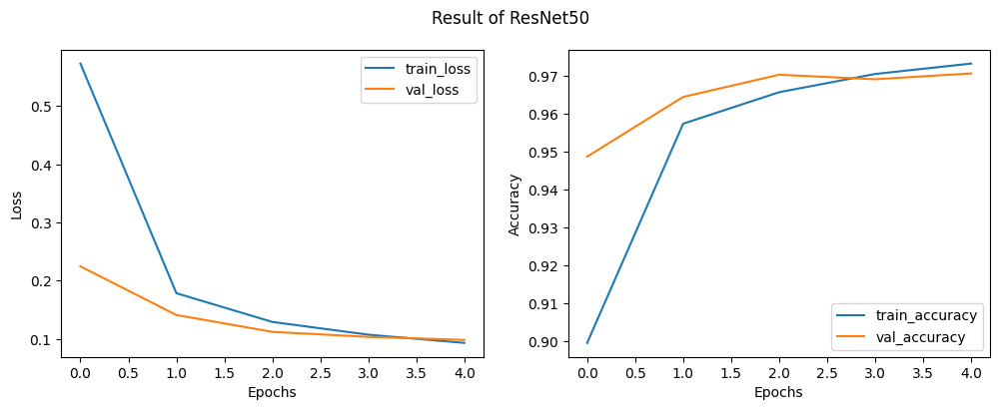

In [48]:
# plotting loss and accuracy from ResNet50 model results
plot_loss_curves(rn50_results, suptitle="Result of ResNet50", save="Result of ResNet50.jpg")

### 7.2. EfficientNet V2 Model Evaluation

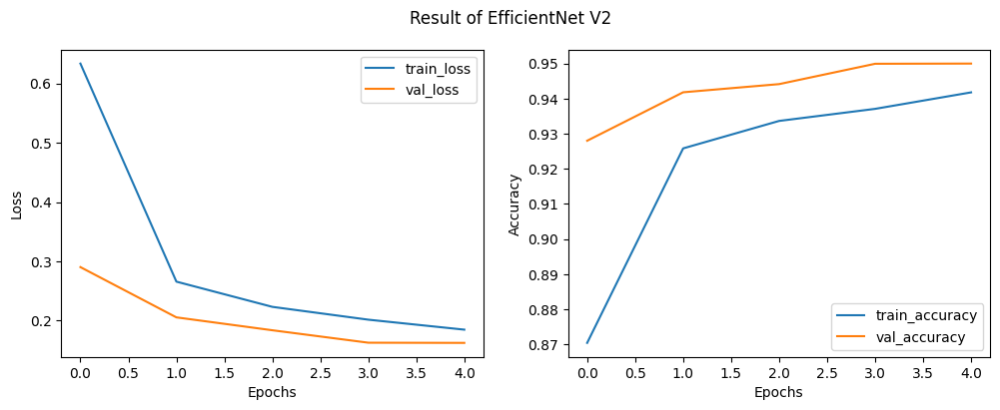

In [35]:
# plotting loss and accuracy from EfficientNet V2 model results
plot_loss_curves(ev2_results, suptitle="Result of EfficientNet V2", save="Result of EfficientNet V2.jpg")

### 7.3. MobiletNet V2 Model Evaluation

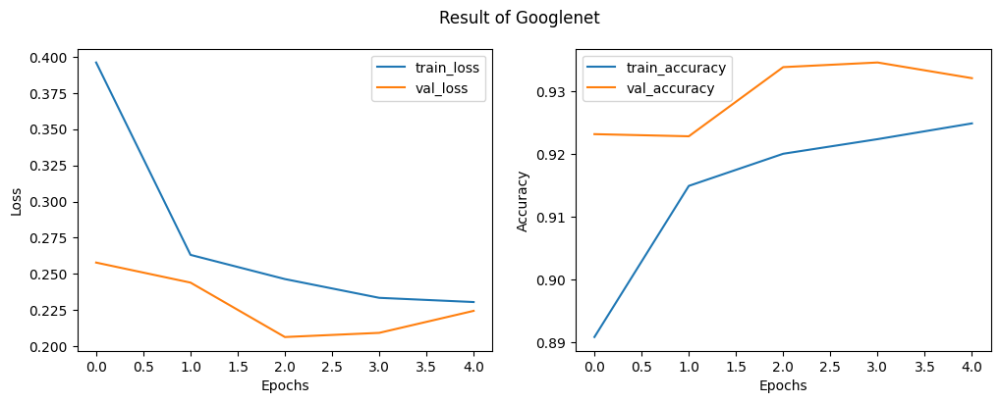

In [74]:
# plotting loss and accuracy from MobileNet model results
plot_loss_curves(mobilenet_results, suptitle="Result of Googlenet", save="Result of MobileNet.jpg")

In the training process, the evaluation metric used is accuracy because it is very frequently used and easy to interpret in classification tasks. From the performance comparison results of the ResNet50 , EfficientNet V2 ,MobileNetV2 models  all have good performance because they have achieved an accuracy of more than 90%. ResNet50 is slightly superior in terms of accuracy and much superior in training time. In 5 epochs, ResNet50 took 25 minutes for the training process,MobileNetV2 also took less time, while EfficientNet V2 took more than an hour . This very long training time is caused by the large dataset, up to 70 thousand images. From these results, the ResNet50 model is chosen as the best model in the plant disease classification task because it has a high accuracy of 97%.

## **8. Saving the Models**

In [37]:
# 1. create models directory
model_path = Path(r"C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection")
model_path.mkdir(parents=True, exist_ok=True)

# 2. create model save path
model_name = "01_plant_diseases_classification_pytorch_rn50.pth"
model_save_path = model_path / model_name

# 3. save the model state dict
print(f"Saving model to: {model_save_path}")
torch.save(obj=rn50_model.state_dict(), # only saving the state_dict() only saves the models learned parameters
           f=model_save_path)

Saving model to: C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection\01_plant_diseases_classification_pytorch_rn50.pth


In [38]:
# 1. create models directory
model_path = Path(r"C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection")
model_path.mkdir(parents=True, exist_ok=True)

# 2. create model save path
model_name = "01_plant_diseases_classification_pytorch_ev2.pth"
model_save_path = model_path / model_name

# 3. save the model state dict
print(f"Saving model to: {model_save_path}")
torch.save(obj=ev2_model.state_dict(), # only saving the state_dict() only saves the models learned parameters
           f=model_save_path)

Saving model to: C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection\01_plant_diseases_classification_pytorch_ev2.pth


In [76]:
# 1. create models directory
model_path = Path(r"C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection")
model_path.mkdir(parents=True, exist_ok=True)

# 2. create model save path
model_name = "01_plant_diseases_classification_pytorch_mobnet.pth"
model_save_path = model_path / model_name

# 3. save the model state dict
print(f"Saving model to: {model_save_path}")
torch.save(obj=mobilenet_model.state_dict(), # only saving the state_dict() only saves the models learned parameters
           f=model_save_path)

Saving model to: C:\Users\peer1\OneDrive\Documents\Guvi_Projects\Final Project\Plant disease detection\01_plant_diseases_classification_pytorch_mobnet.pth


## **9. Making Prediction**

In [44]:
# making prediction on single image

# load the trained ResNet50 model
# do not put model into device
path_model = "/kaggle/working/01_plant_diseases_classification_pytorch_rn50.pth"
model = resnet50(weights=None)
model.fc = nn.Sequential(nn.Linear(in_features=model.fc.in_features, out_features=38))
model.load_state_dict(torch.load(path_model))
model.eval()

# define class labels
class_labels = train_dataset_rn50.classes

# define the transfomation for the test images (same as transformation for validation data)
preprocess = transforms.Compose([
    transforms.Resize(size=232, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(size=224),
    # do not augment in test data
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# prediction function on single image
def predict_image(image_path, model):
    # open and preprocess the image
    image = Image.open(image_path)
    image_tensor = preprocess(image)
    image_tensor = image_tensor.unsqueeze(0)  # add batch dimension

    # make prediction
    with torch.no_grad():
        outputs = model(image_tensor)
        _, predicted = torch.max(outputs, 1)
        confidence = torch.nn.functional.softmax(outputs, dim=1)[0] * 100
        predicted_label = class_labels[predicted.item()]

    # display the image with prediction and confidence
    plt.imshow(image)
    plt.title(f"Prediction: {predicted_label}, Confidence: {confidence[predicted.item()]:.2f}%")
    plt.axis("off")
    plt.show()

C:\Users\peer1\AppData\Local\Temp\ipykernel_17648\2391285194.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path_model))


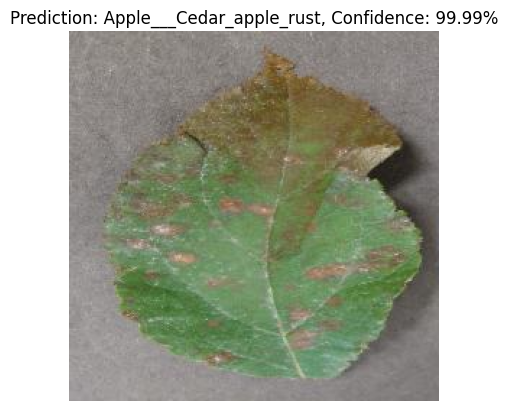

In [47]:
# apple cedar rust prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\AppleCedarRust4.JPG"
predict_image(image_path, model)

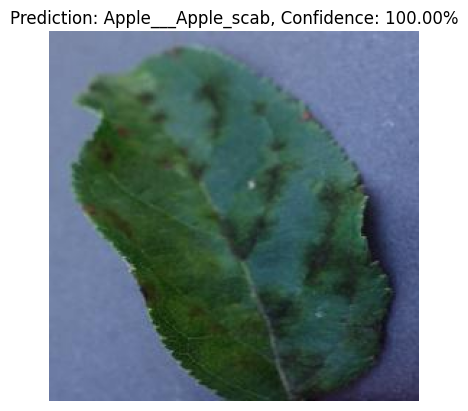

In [48]:
# apple scab prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\AppleScab2.JPG"
predict_image(image_path, model)

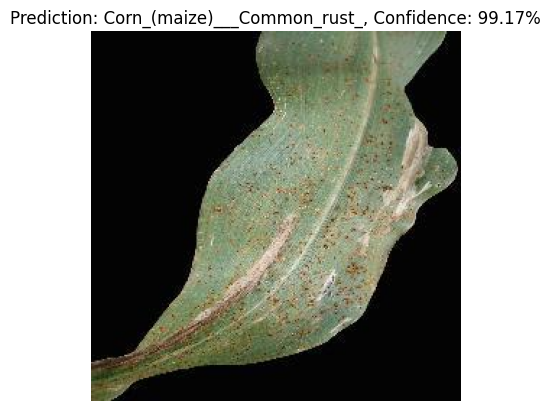

In [49]:
# corn common rust prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\CornCommonRust1.JPG"
predict_image(image_path, model)

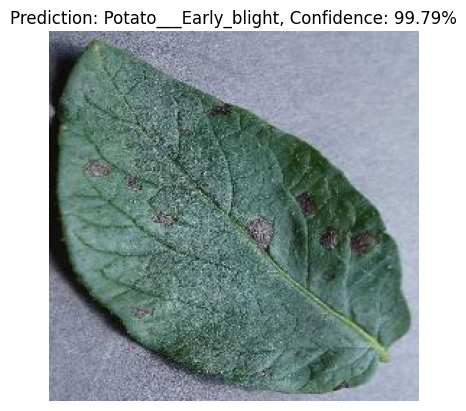

In [50]:
# potato early blight prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\PotatoEarlyBlight3.JPG"
predict_image(image_path, model)

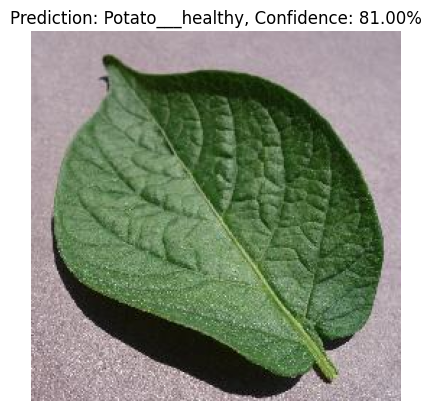

In [51]:
# potato healthy prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\PotatoHealthy1.JPG"
predict_image(image_path, model)

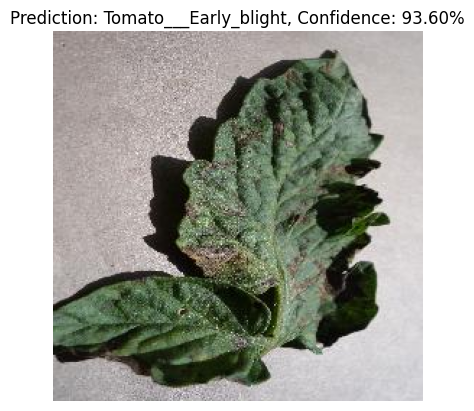

In [52]:
# tomato early blight prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\TomatoEarlyBlight5.JPG"
predict_image(image_path, model)

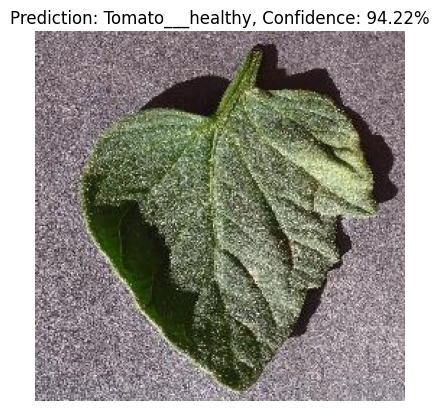

In [53]:
# tomato healthy prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\TomatoHealthy1.JPG"
predict_image(image_path, model)

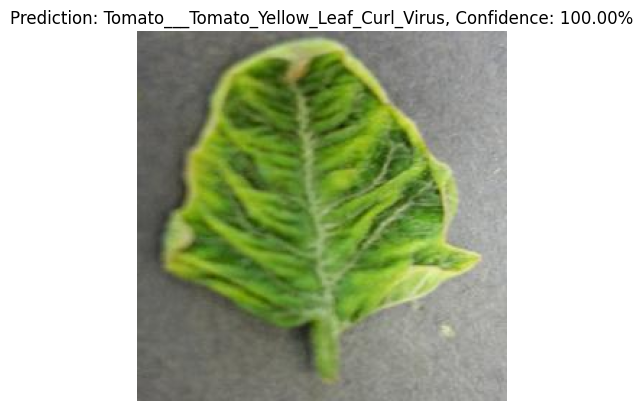

In [54]:
# tomato yellow curl virus prediction
image_path = r"C:\Users\peer1\.cache\kagglehub\datasets\vipoooool\new-plant-diseases-dataset\versions\2\test\test\TomatoYellowCurlVirus6.JPG"
predict_image(image_path, model)

The prediction results on several test images show that the trained ResNet50 model can predict all of them correctly. Furthermore, the model can be used for further deployment stages for production purposes. Thus, the plant disease classification experiment has been completed. From these results, it can be concluded that the use of pre-trained models is very effective and efficient for completing computer vision tasks in general. More specifically, the ResNet50 model has good performance for image classification tasks and fast training time.